In [1]:
import numpy as np
import matplotlib.pyplot as plt

from TO_sim.Sol_Kuramoto import Sol_Kuramoto_mK as mK
from TO_sim.Sol_Kuramoto import Sol_Kuramoto_mf2 as mf2

from TO_sim.gen_Distribution import Quantile_Normal as Q_Normal
from TO_sim.gen_Distribution import Quantile_Lorentzian as Q_Lorentzian

from TO_sim.get_cluster import cluster_os_new2
from TO_sim.get_sec_r import get_r_Fun,get_rp,get_rp2,get_rp3,integrand_Rd3
from scipy import interpolate

import pandas as pd
from tqdm.notebook import tqdm

In [117]:
seed =11
N = 5000
theta_random,omega,Kc = Q_Normal(N,0,1,seed=seed)
# theta_random,omega,Kc = Q_Lorentzian(N,0,1,seed=seed)

omega = omega - np.mean(omega)
omega = np.sort(omega)
m = 6
dt = 0.1
t = np.arange(0,10100,dt)
# K = 5.3
K = 6
to_ppi = lambda y: (y + np.pi)%(2*np.pi) - np.pi
theta, dtheta,rs = mf2(K,N=N,m=m,t_array=t,p_theta=theta_random,p_dtheta=0*omega,p_omega=omega)

Text(0.5, 1.0, '$K=6,m=6,N=5000$')

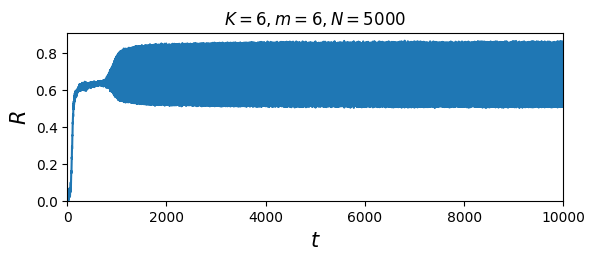

In [127]:
plt.subplot(211)
plt.plot(t,rs)
plt.xlabel(r'$t$',fontsize=15)
plt.ylabel(r'$R$',fontsize=15)
plt.xlim(0,1e4)
plt.ylim(0,)
plt.title(rf'$K={K},m={m},N={N}$')

In [128]:
s_lang = 1000

In [129]:
avg_dtheta = (theta[s_lang:] - theta[0:-s_lang])/(t[s_lang]-t[0])

In [130]:
theta[:,]

array([[-2.00892479e+00, -3.01922610e+00, -2.31104814e-01, ...,
        -2.56862802e+00, -1.62654046e+00, -8.72302776e-01],
       [-2.01183472e+00, -3.02200034e+00, -2.33784268e-01, ...,
        -2.56592882e+00, -1.62373606e+00, -8.69350033e-01],
       [-2.02050014e+00, -3.03026185e+00, -2.41763402e-01, ...,
        -2.55789051e+00, -1.61538457e+00, -8.60556981e-01],
       ...,
       [-3.56080641e+04, -3.37928115e+04, -3.26267022e+04, ...,
         3.26239600e+04,  3.37856472e+04,  3.56090153e+04],
       [-3.56084234e+04, -3.37931592e+04, -3.26270204e+04, ...,
         3.26242795e+04,  3.37859695e+04,  3.56093737e+04],
       [-3.56087870e+04, -3.37935090e+04, -3.26273341e+04, ...,
         3.26246044e+04,  3.37862957e+04,  3.56097367e+04]])

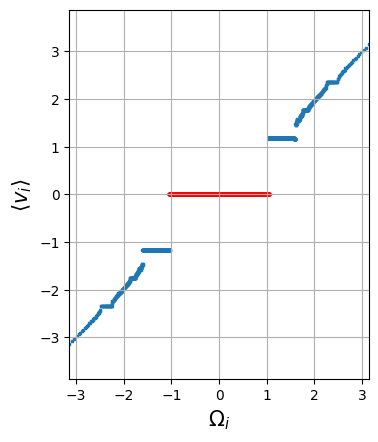

In [131]:
v_t = avg_dtheta[-1]
con0 = np.abs(v_t) < 0.1 
c_0, = np.where(con0)
c_p, = np.where(np.logical_and(~con0, omega > 0))
c_m, = np.where(np.logical_and(~con0, omega < 0))
plt.scatter(omega,v_t,marker='s',s=0.8)
plt.scatter(omega[c_0],v_t[c_0],marker='s',color='r',s=1)
plt.xlabel(r'$\Omega_i$',fontsize=15)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)
plt.xlim(-np.pi,np.pi)
plt.gca().set_aspect('equal')
plt.grid()
# plt.ylim(-0.1,0.1)
# plt.title(rf'$K={K},m={m},N={N}$')

In [132]:
r0 = np.abs(np.mean(np.exp(1j*theta[:,c_0]),axis=1) * len(c_0)/N)
rp_ = np.abs(np.mean(np.exp(1j*theta[:,c_p]),axis=1) * len(c_p)/N)
rm_ = np.abs(np.mean(np.exp(1j*theta[:,c_m]),axis=1) * len(c_m)/N)

In [133]:
r_s = np.array([np.mean(rs[i:s_lang+i]) for i in range(len(rs)-s_lang)])

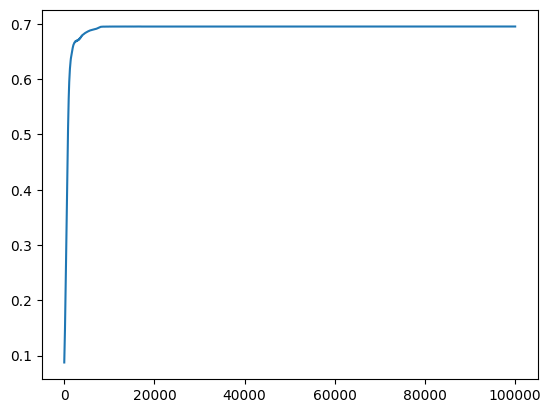

In [134]:
r0_s = np.array([np.mean(r0[i:s_lang+i]) for i in range(len(r0)-s_lang)])
rp_s = np.array([np.mean(rp_[i:s_lang+i]) for i in range(len(rp_)-s_lang)])
rm_s = np.array([np.mean(rm_[i:s_lang+i]) for i in range(len(rm_)-s_lang)])

plt.plot(np.abs(r0_s))

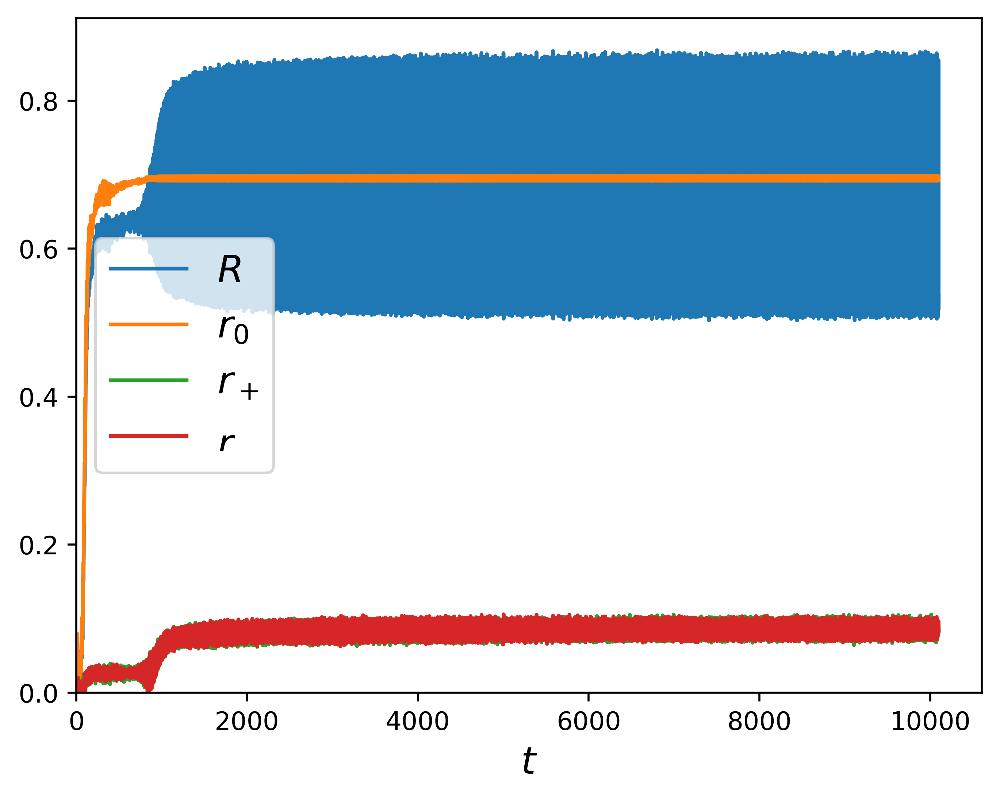

In [135]:
plt.figure(dpi = 500)
plt.plot(t[:],np.abs(rs),label=r'$R$')
plt.plot(t[:],np.abs(r0),label=r'$r_0$')
plt.plot(t[:],np.abs(rp_),label=r'$r_+$')
plt.plot(t[:],np.abs(rm_),label=r'$r_-$')
plt.xlabel(r'$t$',fontsize=15)
plt.ylim(0,)
plt.xlim(0,)
plt.legend(fontsize=15)
# plt.grid()
# plt.title(rf'$K={K},m={m},N={N}$')


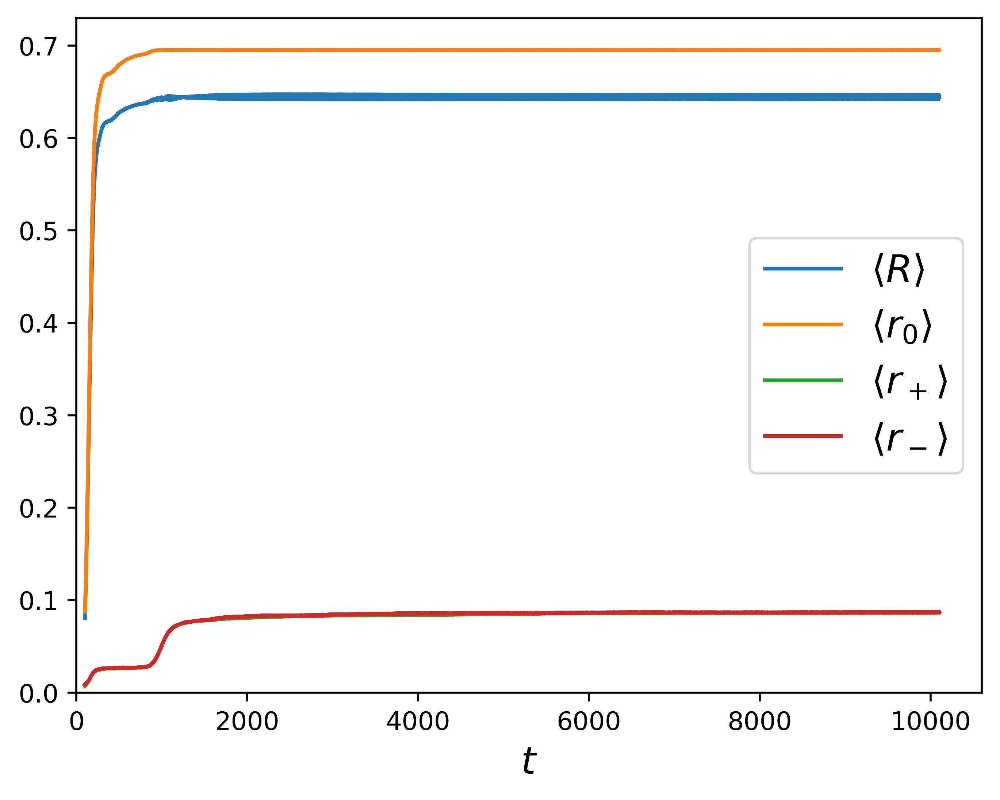

In [136]:
plt.figure(dpi = 500)
plt.plot(t[s_lang:],np.abs(r_s),label=r'$\langle R \rangle $')
plt.plot(t[s_lang:],np.abs(r0_s),label=r'$\langle r_0 \rangle$')
plt.plot(t[s_lang:],np.abs(rp_s),label=r'$\langle r_+ \rangle$')
plt.plot(t[s_lang:],np.abs(rm_s),label=r'$\langle r_- \rangle$')
plt.xlabel(r'$t$',fontsize=15)
plt.ylim(0,)
plt.xlim(0,)
plt.legend(fontsize=15)
# plt.grid()
# plt.title(rf'$K={K},m={m},N={N}$')


In [137]:
OPS = 4/np.pi * np.sqrt(K*r_s/m) - 0.3056/np.sqrt(K*r_s*m**3)
opp = 4/np.pi * np.sqrt(K*rp_s/m) - 0.3056/np.sqrt(K*rp_s*m**3)
dps =  1/2 *m*K*K*r0_s*rp_s/(m**2 * OPS**2 + 1) + K*K* rp_s*rp_s/(4*OPS*(1+4*OPS**2*m**2))

In [138]:
OPS = 4/np.pi * np.sqrt(K*r_s/m) - 0.3056/np.sqrt(K*r_s*m**3)
opp = 4/np.pi * np.sqrt(K*rp_/m) - 0.3056/np.sqrt(K*rp_*m**3)
dps =  1/2 *m*K*K*r0*rp_/(m**2 * OPS**2 + 1) + K*K* rp_*rp_/(4*OPS*(1+4*OPS**2*m**2))

ValueError: operands could not be broadcast together with shapes (101000,) (100000,) 

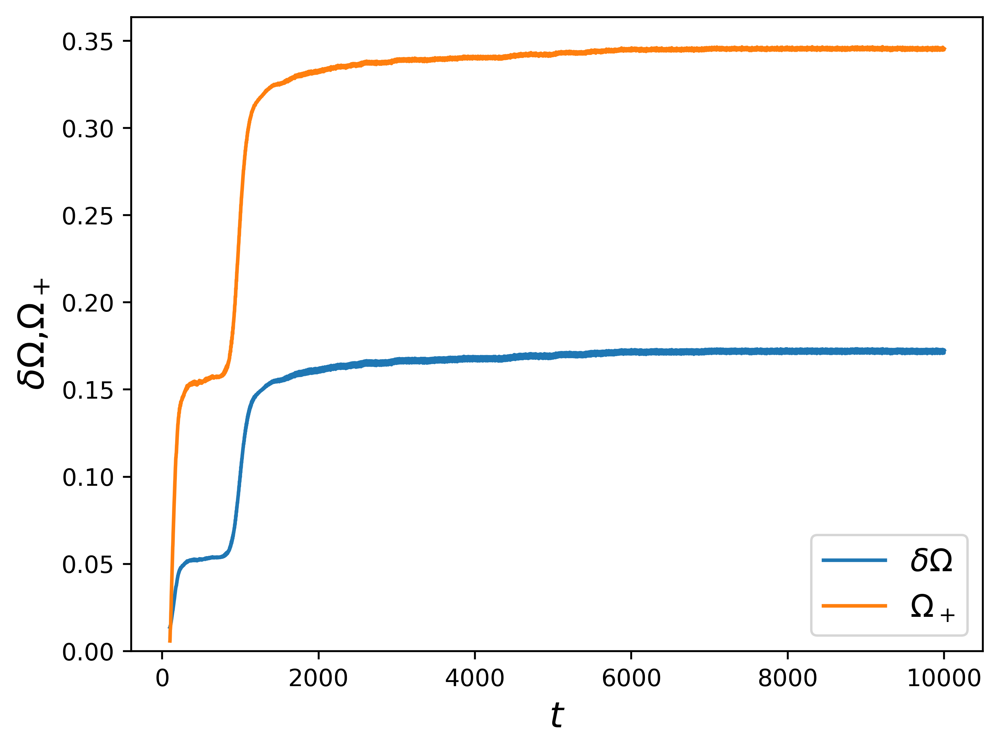

In [ ]:
plt.figure(dpi = 500)
plt.plot(t[s_lang:],dps,label=r'$\delta\Omega$')
plt.plot(t[s_lang:],opp[:],label=r'$\Omega_+$')
# plt.xlim(0,5000)
plt.xlabel(r'$t$',fontsize=15)
plt.ylim(0,)
plt.ylabel(r'$\delta\Omega$,$\Omega_+$',fontsize=15)
plt.legend(fontsize=13)

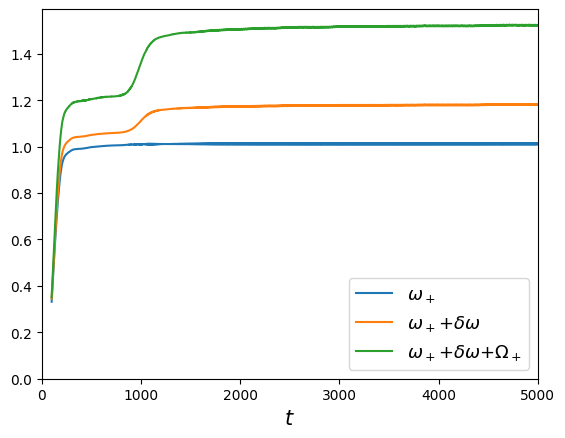

In [ ]:
plt.plot(t[s_lang:],OPS,label=r'$\omega_+$')
plt.plot(t[s_lang:],OPS+dps,label=r'$\omega_+$+$\delta\omega$')
plt.plot(t[s_lang:],OPS+dps+opp,label=r'$\omega_+$+$\delta\omega$+$\Omega_+$')
plt.xlim(0,5000)
plt.xlabel(r'$t$',fontsize=15)
plt.ylim(0,)
# plt.ylabel(r'$\delta\Omega$',fontsize=15)
plt.legend(fontsize=13)


In [ ]:
o_p = np.where(omega > 0)[0]

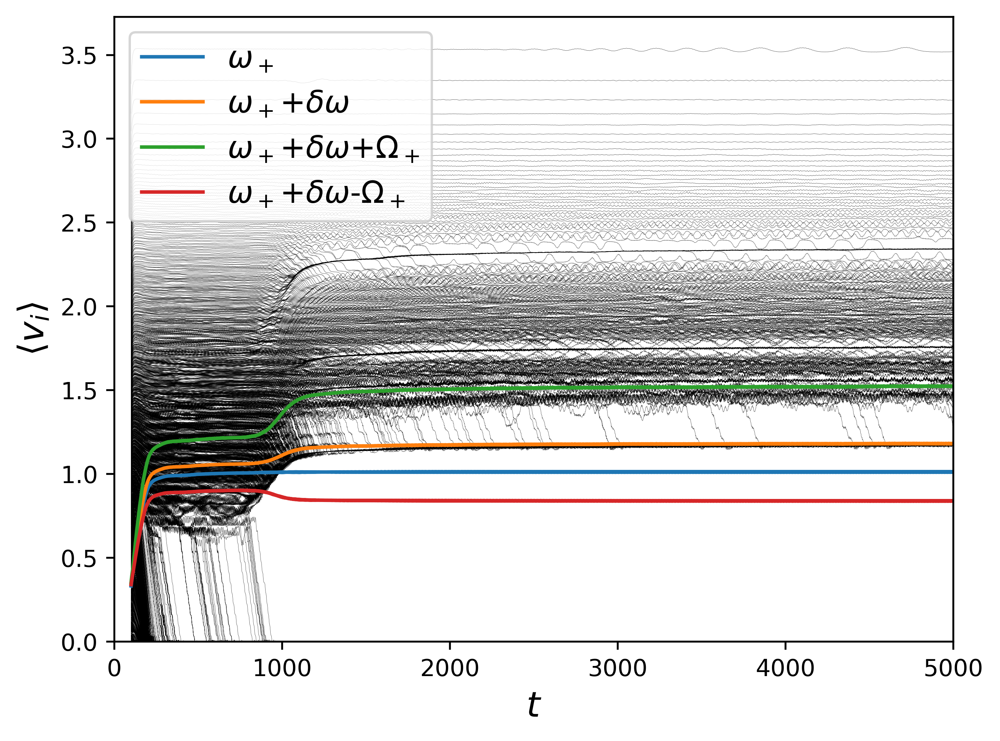

In [ ]:
plt.figure(dpi = 500)
plt.plot(t[s_lang::20],avg_dtheta[::20,o_p],color='k',alpha=0.9,lw=0.1);

plt.plot(t[s_lang::20],OPS[::20],label=r'$\omega_+$')
plt.plot(t[s_lang::20],OPS[::20]+dps[::20],label=r'$\omega_+$+$\delta\omega$')
plt.plot(t[s_lang::20],OPS[::20]+dps[::20]+opp[::20],label=r'$\omega_+$+$\delta\omega$+$\Omega_+$')
plt.plot(t[s_lang::20],OPS[::20]+dps[::20]-opp[::20],label=r'$\omega_+$+$\delta\omega$-$\Omega_+$')
plt.xlim(0,5000)
plt.xlabel(r'$t$',fontsize=15)
plt.ylim(0,)
# plt.ylabel(r'$\delta\Omega$',fontsize=15)
plt.legend(fontsize=13,loc='upper left')
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)
plt.xlabel(r'$t$',fontsize=15)
plt.show()

ValueError: operands could not be broadcast together with shapes (100000,) (101000,) 

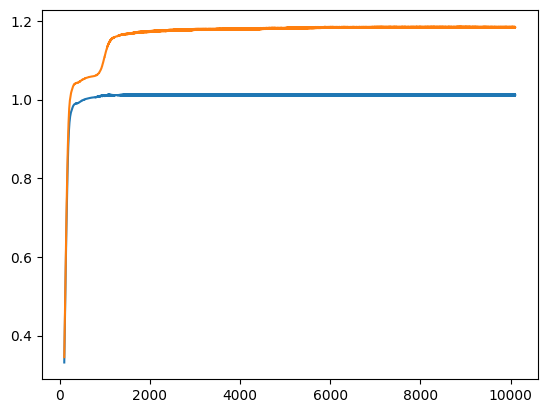

In [139]:
plt.plot(t[s_lang:],OPS,label=r'$\omega_+$')
plt.plot(t[s_lang:],OPS+dps,label=r'$\omega_+$+$\delta\omega$')
plt.plot(t[s_lang:],OPS+dps+opp,label=r'$\omega_+$+$\delta\omega$+$\Omega_+$')
plt.xlim(0,5000)
plt.xlabel(r'$t$',fontsize=15)
plt.ylim(0,)
# plt.ylabel(r'$\delta\Omega$',fontsize=15)
plt.legend(fontsize=13)


(-0.4, 0.4)

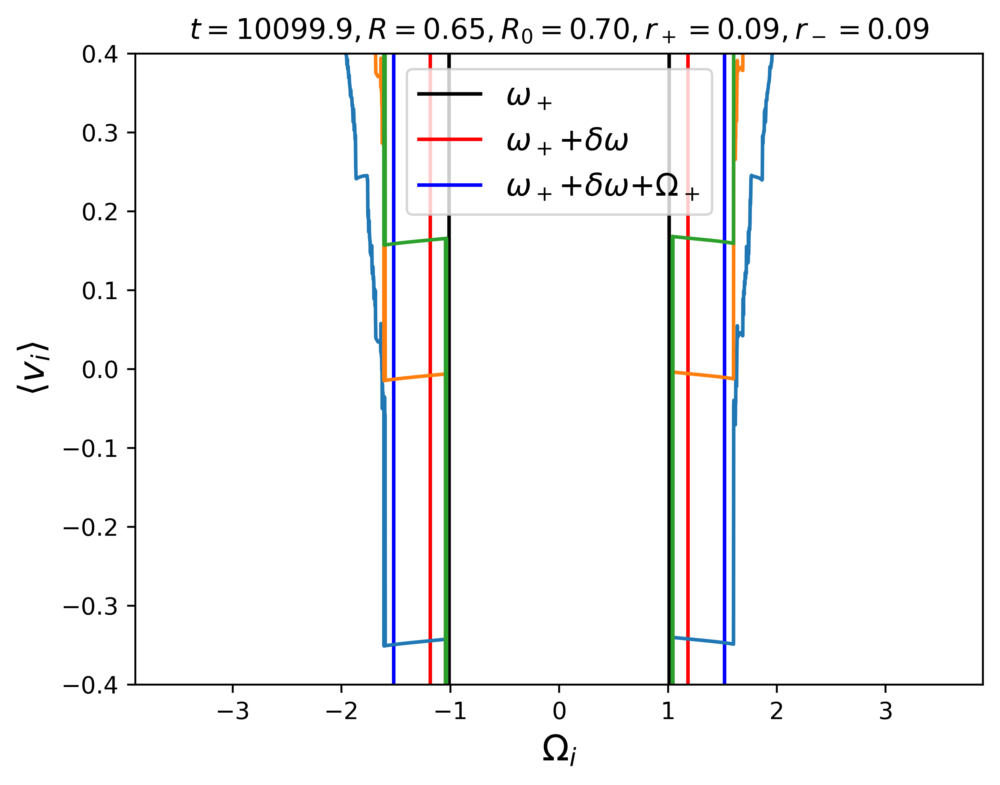

In [140]:
idx = -1
plt.figure(dpi = 500)
plt.title(rf'$t={t[idx]:.01f},R={r_s[idx]:.02f},R_0={r0_s[idx]:.02f},r_+={rp_s[idx]:.02f},r_-={rm_s[idx]:.02f}$')
plt.axvline(OPS[idx],color='k',label=r'$\omega_+$')
plt.axvline(-OPS[idx],color='k')
plt.axvline(OPS[idx]+dps[idx],color='r',label=r'$\omega_+$+$\delta\omega$')
plt.axvline(-(OPS[idx]+dps[idx]),color='r')

plt.axvline(OPS[idx]+dps[idx]+opp[idx],color='b',label=r'$\omega_+$+$\delta\omega$+$\Omega_+$')
plt.axvline(-(OPS[idx]+dps[idx]+opp[idx]),color='b')

plt.xlabel(r'$\Omega_i$',fontsize=15)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)

plt.legend(fontsize=13)
plt.plot(omega,np.abs(avg_dtheta[idx])-(OPS[idx]+dps[idx]+opp[idx]))
plt.plot(omega,np.abs(avg_dtheta[idx])-(OPS[idx]+dps[idx]))
plt.plot(omega,np.abs(avg_dtheta[idx])-(OPS[idx]))
plt.ylim(-0.4,0.4)

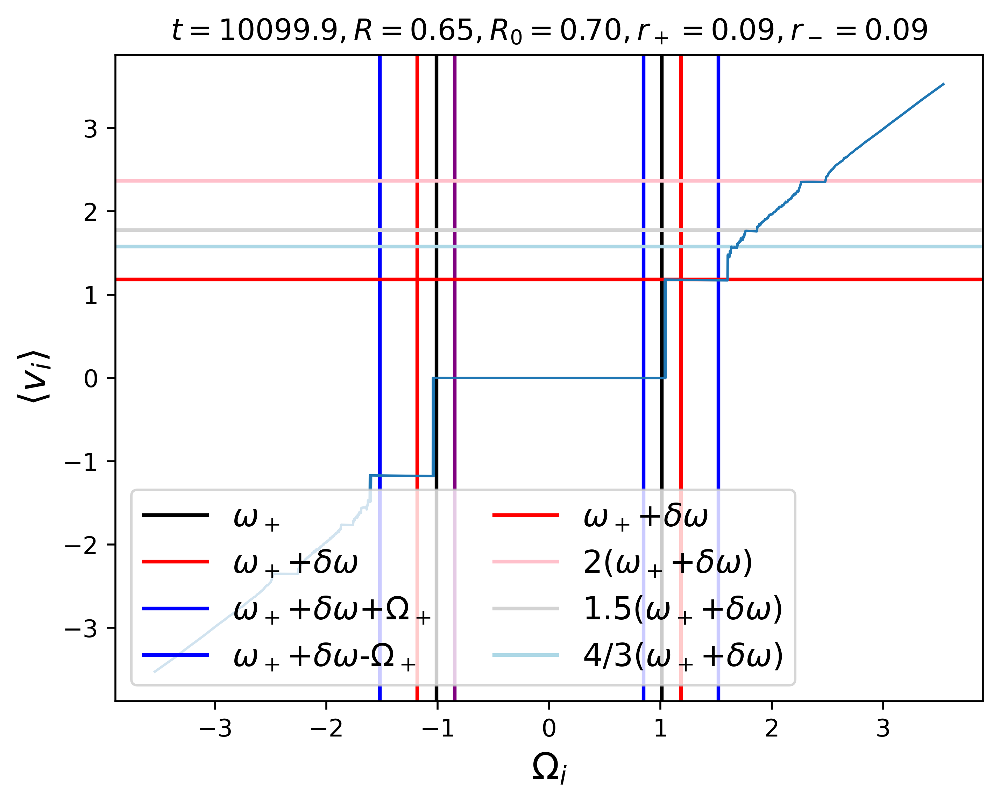

In [141]:
idx = -1
plt.figure(dpi = 500)
plt.title(rf'$t={t[idx]:.01f},R={r_s[idx]:.02f},R_0={r0_s[idx]:.02f},r_+={rp_s[idx]:.02f},r_-={rm_s[idx]:.02f}$')
plt.axvline(OPS[idx],color='k',label=r'$\omega_+$')
plt.axvline(-OPS[idx],color='k')
plt.axvline(OPS[idx]+dps[idx],color='r',label=r'$\omega_+$+$\delta\omega$')
plt.axvline(-(OPS[idx]+dps[idx]),color='r')

plt.axvline(OPS[idx]+dps[idx]+opp[idx],color='b',label=r'$\omega_+$+$\delta\omega$+$\Omega_+$')
plt.axvline(OPS[idx]+dps[idx]-opp[idx],color='b',label=r'$\omega_+$+$\delta\omega$-$\Omega_+$')

plt.axvline(-(OPS[idx]+dps[idx]+opp[idx]),color='b')
plt.axvline(-(OPS[idx]+dps[idx]-opp[idx]),color='purple')
plt.axhline(OPS[idx]+dps[idx],color='r',label=r'$\omega_+$+$\delta\omega$')
plt.axhline(2*(OPS[idx]+dps[idx]),color='pink',label=r'2$(\omega_+$+$\delta\omega)$')

plt.axhline(1.5*(OPS[idx]+dps[idx]),color='lightgrey',label=r'1.5$(\omega_+$+$\delta\omega)$')
plt.axhline(4/3*(OPS[idx]+dps[idx]),color='lightblue',label=r'4/3$(\omega_+$+$\delta\omega)$')
plt.xlabel(r'$\Omega_i$',fontsize=15)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)
# plt.grid()
plt.legend(fontsize=13,ncol=2,loc='lower left')
plt.plot(omega,avg_dtheta[idx],lw=1)

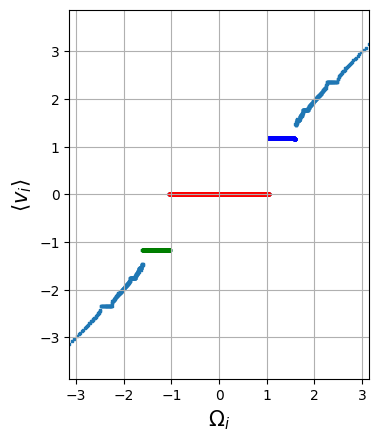

In [145]:
v_t = avg_dtheta[-1]
con0 = np.abs(v_t) < 0.1 
c_0, = np.where(con0)
c_p0, = np.where(np.abs(v_t-OPS[idx]-dps[idx]) < 0.1)
c_m0, = np.where(np.abs(v_t+OPS[idx]+dps[idx]) < 0.1)


c_p, = np.where(np.logical_and(~con0, omega > 0))
c_m, = np.where(np.logical_and(~con0, omega < 0))

plt.scatter(omega,v_t,marker='s',s=0.8)
plt.scatter(omega[c_0],v_t[c_0],marker='s',color='r',s=1)
plt.scatter(omega[c_p0],v_t[c_p0],marker='s',color='b',s=1)
plt.scatter(omega[c_m0],v_t[c_m0],marker='s',color='g',s=1)
plt.xlabel(r'$\Omega_i$',fontsize=15)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)
plt.xlim(-np.pi,np.pi)
plt.gca().set_aspect('equal')
plt.grid()
# plt.ylim(-0.1,0.1)
# plt.title(rf'$K={K},m={m},N={N}$')

In [146]:
r0 = np.abs(np.mean(np.exp(1j*theta[:,c_0]),axis=1) * len(c_0)/N)
rp_0 = np.abs(np.mean(np.exp(1j*theta[:,c_p0]),axis=1) * len(c_p)/N)
rm_0 = np.abs(np.mean(np.exp(1j*theta[:,c_m0]),axis=1) * len(c_m)/N)

In [ ]:
rho_0 = np.abs(np.mean(np.exp(1j*theta[:,c_0]),axis=1) )
rho_p = np.abs(np.mean(np.exp(1j*theta[:,c_p0]),axis=1))
rho_m= np.abs(np.mean(np.exp(1j*theta[:,c_m0]),axis=1) )

In [203]:
rho_m_0 = np.array([np.mean(rho_0[i:s_lang+i]) for i in range(len(rho_0)-s_lang)])
rho_m_p = np.array([np.mean(rho_p[i:s_lang+i]) for i in range(len(rho_p)-s_lang)])
rho_m_m = np.array([np.mean(rho_m[i:s_lang+i]) for i in range(len(rho_m)-s_lang)])


std_m_0 = np.array([np.nanstd(rho_0[i:s_lang+i]) for i in range(len(rho_0)-s_lang)])
std_m_p = np.array([np.nanstd(rho_p[i:s_lang+i]) for i in range(len(rho_p)-s_lang)])
std_m_m = np.array([np.nanstd(rho_m[i:s_lang+i]) for i in range(len(rho_m)-s_lang)])

In [149]:
r_p = np.abs(np.mean(np.exp(1j*theta[:,c_p]),axis=1) * len(c_p)/N)
r_m = np.abs(np.mean(np.exp(1j*theta[:,c_m]),axis=1) * len(c_m)/N)

(0.0, 1.0)

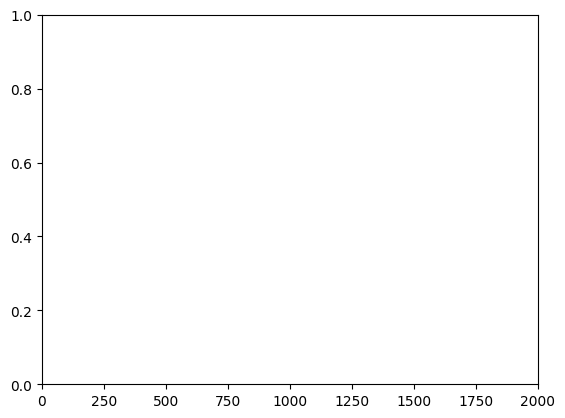

In [ ]:
ax1.plot(t[:-s_lang],rho_m_0)
ax1.plot(t[:-s_lang],rho_m_p)
ax1.plot(t[:-s_lang],rho_m_m)
ax1.fill_between(t[:-s_lang],rho_m_0-std_m_0,rho_m_0+std_m_0,alpha=0.3)
ax1.fill_between(t[:-s_lang],rho_m_p-std_m_p,rho_m_p+std_m_p,alpha=0.3)
ax1.fill_between(t[:-s_lang],rho_m_m-std_m_m,rho_m_m+std_m_m,alpha=0.3)


plt.xlim(0,2000)
plt.ylim(0,1)

In [153]:
m_v_0 = np.mean(avg_dtheta[::1,c_0],axis=1)
m_v_p = np.mean(avg_dtheta[::1,c_p0],axis=1)
m_v_m = np.mean(avg_dtheta[::1,c_m0],axis=1)

In [154]:
c0_p = np.where(avg_dtheta[::1,c_0]>=m_v_0.reshape(-1,1),avg_dtheta[::1,c_0],np.nan)
c0_m = np.where(avg_dtheta[::1,c_0]<=m_v_0.reshape(-1,1),avg_dtheta[::1,c_0],np.nan)
cp_p = np.where(avg_dtheta[::1,c_p0]>=m_v_p.reshape(-1,1),avg_dtheta[::1,c_p0],np.nan)
cp_m = np.where(avg_dtheta[::1,c_p0]<=m_v_p.reshape(-1,1),avg_dtheta[::1,c_p0],np.nan)
cm_p = np.where(avg_dtheta[::1,c_m0]>=m_v_m.reshape(-1,1),avg_dtheta[::1,c_m0],np.nan)
cm_m = np.where(avg_dtheta[::1,c_m0]<=m_v_m.reshape(-1,1),avg_dtheta[::1,c_m0],np.nan)



In [155]:
std_v_0p = np.nanstd(c0_p,axis=1)
std_v_0m = np.nanstd(c0_m,axis=1)
std_v_pm = np.nanstd(cp_m,axis=1)
std_v_pp = np.nanstd(cp_p,axis=1)
std_v_mp = np.nanstd(cm_p,axis=1)
std_v_mm = np.nanstd(cm_m,axis=1)

In [156]:
max_v_0 = np.max(avg_dtheta[::1,c_0],axis=1)
min_v_0 = np.min(avg_dtheta[::1,c_0],axis=1)  
max_v_p = np.max(avg_dtheta[::1,c_p0],axis=1)
min_v_p = np.min(avg_dtheta[::1,c_p0],axis=1)
max_v_m = np.max(avg_dtheta[::1,c_m0],axis=1)
min_v_m = np.min(avg_dtheta[::1,c_m0],axis=1) 

In [157]:
q75_v_0 = np.percentile(avg_dtheta[::1,c_0], 75, axis=1)
q25_v_0 = np.percentile(avg_dtheta[::1,c_0], 25, axis=1)
q75_v_p = np.percentile(avg_dtheta[::1,c_p0], 75, axis=1) 
q25_v_p = np.percentile(avg_dtheta[::1,c_p0], 25, axis=1)
q75_v_m = np.percentile(avg_dtheta[::1,c_m0], 75, axis=1)
q25_v_m = np.percentile(avg_dtheta[::1,c_m0], 25, axis=1)

In [180]:
percentiles = np.arange(1, 100)  # 1..99

A0 = avg_dtheta[:, c_0]   # [::1]은 불필요하니 제거(성능+가독성)
Ap = avg_dtheta[:, c_p0]
Am = avg_dtheta[:, c_m0]

# q를 한 번에 전달 → 결과 shape: (len(q), n_time) → 전치
v_0_percentiles = np.percentile(A0, percentiles, axis=1, method="linear").T
v_p_percentiles = np.percentile(Ap, percentiles, axis=1, method="linear").T
v_m_percentiles = np.percentile(Am, percentiles, axis=1, method="linear").T

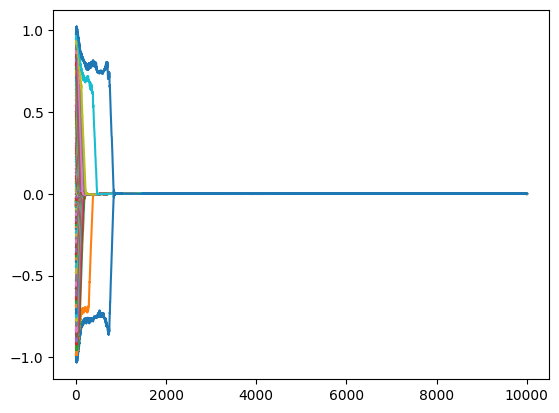

In [177]:
plt.plot(t[:-s_lang],v_0_percentiles)

(0.0, 2000.0)

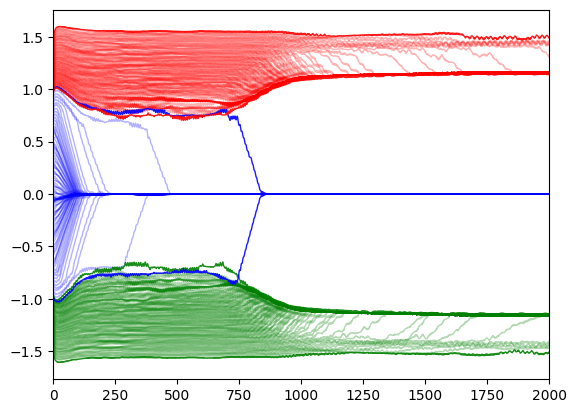

In [ ]:
plt.plot(t[:-s_lang],v_0_percentiles,color='b',lw=1,alpha=0.3);
plt.plot(t[:-s_lang],v_p_percentiles,color='r',lw=1,alpha=0.3);
plt.plot(t[:-s_lang],v_m_percentiles,color='g',lw=1,alpha=0.3);
plt.plot(t[:-s_lang],max_v_0,color='b',lw=1,alpha=0.9);
plt.plot(t[:-s_lang],max_v_p,color='r',lw=1,alpha=0.9);
plt.plot(t[:-s_lang],max_v_m,color='g',lw=1,alpha=0.9);

plt.plot(t[:-s_lang],min_v_0,color='b',lw=1,alpha=0.9);
plt.plot(t[:-s_lang],min_v_p,color='r',lw=1,alpha=0.9);
plt.plot(t[:-s_lang],min_v_m,color='g',lw=1,alpha=0.9);

plt.xlim(0,2000)



In [158]:
q99_v_0 = np.percentile(avg_dtheta[::1,c_0], 99, axis=1)
q01_v_0 = np.percentile(avg_dtheta[::1,c_0], 1, axis=1)
q99_v_p = np.percentile(avg_dtheta[::1,c_p0], 99, axis=1) 
q01_v_p = np.percentile(avg_dtheta[::1,c_p0], 1, axis=1)
q99_v_m = np.percentile(avg_dtheta[::1,c_m0], 99, axis=1)
q01_v_m = np.percentile(avg_dtheta[::1,c_m0], 1, axis=1)

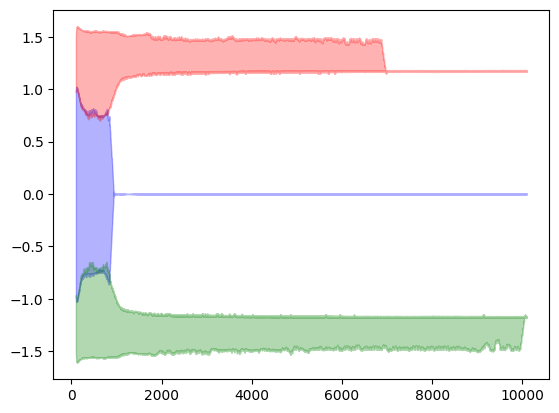

In [159]:
plt.fill_between(t[s_lang:],min_v_0,max_v_0,color='b',alpha=0.3)
plt.fill_between(t[s_lang:],min_v_p,max_v_p,color='r',alpha=0.3)
plt.fill_between(t[s_lang:],min_v_m,max_v_m,color='g',alpha=0.3)

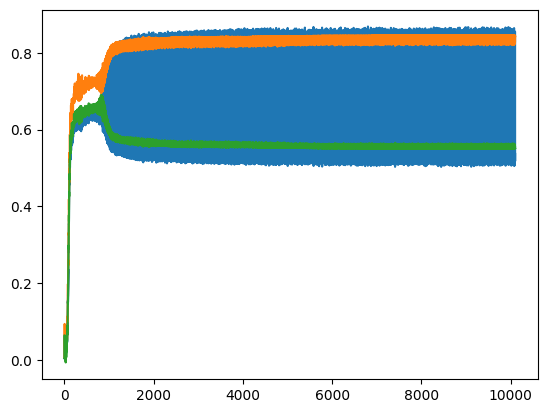

In [166]:
plt.plot(t,rs)
plt.plot(t,r0+rp_0)
plt.plot(t,r0-rp_0)

(0.0, 2000.0)

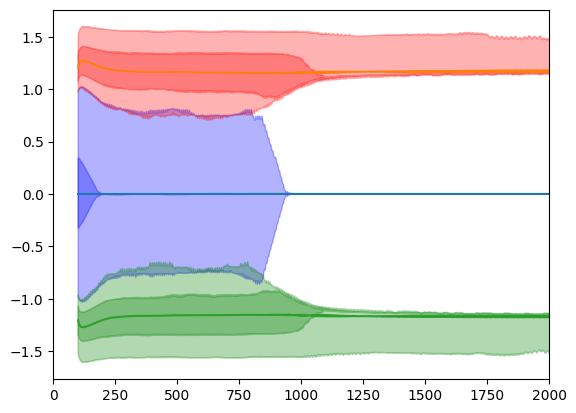

In [162]:
plt.fill_between(t[s_lang:],q25_v_0,q75_v_0,color='b',alpha=0.3)
plt.fill_between(t[s_lang:],q25_v_p,q75_v_p,color='r',alpha=0.3)
plt.fill_between(t[s_lang:],q25_v_m,q75_v_m,color='g',alpha=0.3)

# plt.fill_between(t[s_lang:],q01_v_0,q99_v_0,color='b',alpha=0.3)
# plt.fill_between(t[s_lang:],q01_v_p,q99_v_p,color='r',alpha=0.3)
# plt.fill_between(t[s_lang:],q01_v_m,q99_v_m,color='g',alpha=0.3)

plt.fill_between(t[s_lang:],min_v_0,max_v_0,color='b',alpha=0.3)
plt.fill_between(t[s_lang:],min_v_p,max_v_p,color='r',alpha=0.3)
plt.fill_between(t[s_lang:],min_v_m,max_v_m,color='g',alpha=0.3)


plt.plot(t[s_lang:],m_v_0)
plt.plot(t[s_lang:],m_v_p)
plt.plot(t[s_lang:],m_v_m)

plt.xlim(0,2000)


C:\Users\kim9y\AppData\Local\Temp\ipykernel_8680\3796790842.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


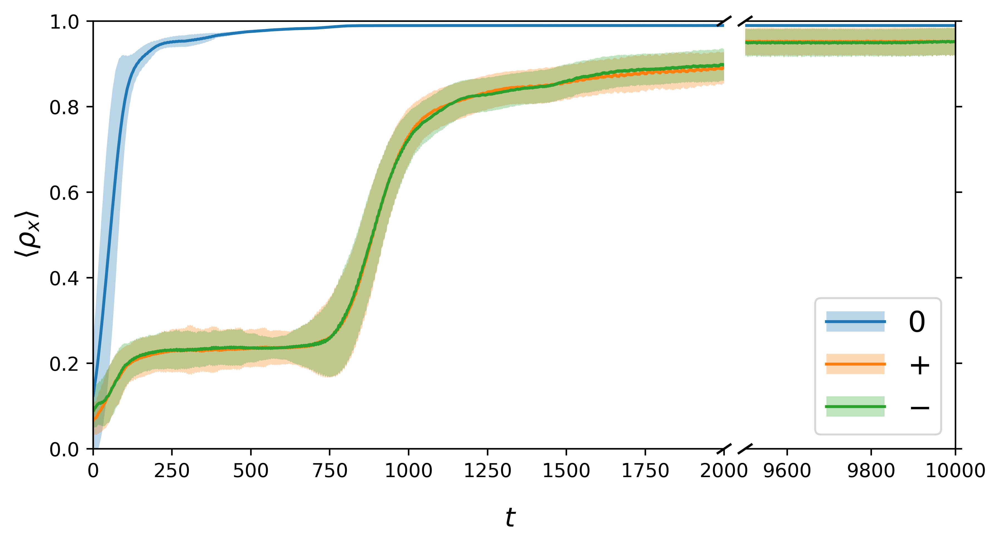

In [210]:
import matplotlib.pyplot as plt

# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 2000)         # 왼쪽 x 구간
RIGHT_XLIM  = (9500, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [3, 1]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.010            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=True, figsize=(8, 4),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)

# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)

# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
ax1.plot(t[:-s_lang],rho_m_0)
ax1.plot(t[:-s_lang],rho_m_p)
ax1.plot(t[:-s_lang],rho_m_m)
ax1.fill_between(t[:-s_lang],rho_m_0-std_m_0,rho_m_0+std_m_0,alpha=0.3)
ax1.fill_between(t[:-s_lang],rho_m_p-std_m_p,rho_m_p+std_m_p,alpha=0.3)
ax1.fill_between(t[:-s_lang],rho_m_m-std_m_m,rho_m_m+std_m_m,alpha=0.3)

# 오른쪽도 동일
l0, = ax2.plot(t[:-s_lang],rho_m_0)
lp, = ax2.plot(t[:-s_lang],rho_m_p)
lm, = ax2.plot(t[:-s_lang],rho_m_m)
b0 = ax2.fill_between(t[:-s_lang],rho_m_0-std_m_0,rho_m_0+std_m_0,alpha=0.3)
bp = ax2.fill_between(t[:-s_lang],rho_m_p-std_m_p,rho_m_p+std_m_p,alpha=0.3)
bm = ax2.fill_between(t[:-s_lang],rho_m_m-std_m_m,rho_m_m+std_m_m,alpha=0.3)


ax2.legend([(l0,b0),(lp,bp),(lm,bm)],[r'$0$',r'$+$',r'$-$'],loc='lower right',fontsize=15)
# --------------------------------------------------
ax1.set_ylim(0,1)
# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d, 1+d), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d, 1+d), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*3, +d*3), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*3, +d*3), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향

# 라벨
ax1.set_ylabel(r"$\langle \rho_x \rangle$", fontsize=14)
fig.text(0.5, -0.03, r"$t$", ha="center", fontsize=14)

plt.tight_layout()
plt.show()


C:\Users\kim9y\AppData\Local\Temp\ipykernel_8680\980398733.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


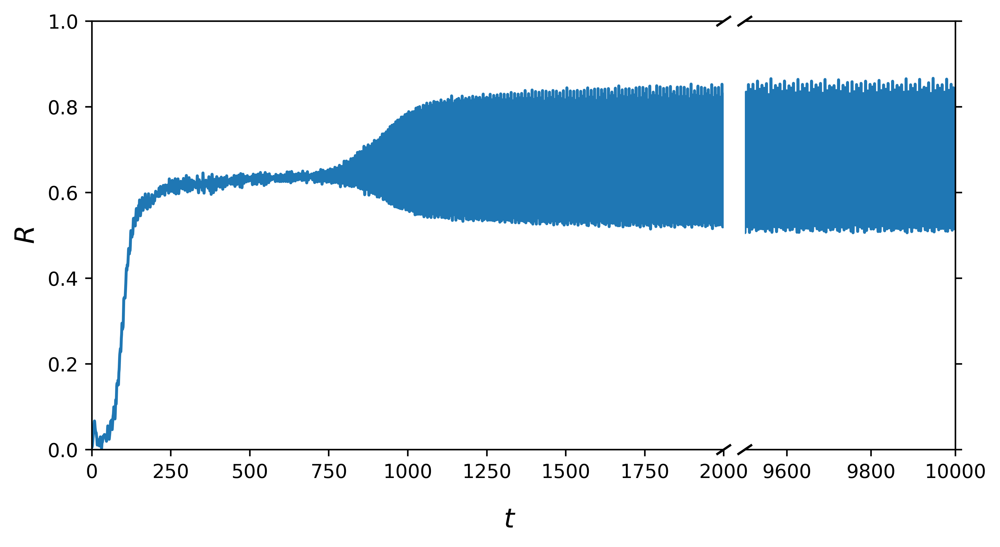

In [212]:
import matplotlib.pyplot as plt

# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 2000)         # 왼쪽 x 구간
RIGHT_XLIM  = (9500, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [3, 1]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.010            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=True, figsize=(8, 4),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)

# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)

# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
ax1.plot(t,rs)
ax2.plot(t,rs)

# --------------------------------------------------
ax1.set_ylim(0,1)
# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d, 1+d), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d, 1+d), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*3, +d*3), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*3, +d*3), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향

# 라벨
ax1.set_ylabel(r"$R$", fontsize=14)
fig.text(0.5, -0.03, r"$t$", ha="center", fontsize=14)

plt.tight_layout()
plt.show()


In [214]:
theta.shape

(101000, 5000)

In [220]:
import numpy as np

T, N = theta.shape            # theta: (T, N)
W = 1000
B = 200                        # 10 step마다 저장 & 갱신

# 1) 미리 u(t,i) = e^{i theta} (bandwidth 줄이려면 complex64 권장)
u = np.exp(1j * theta, dtype=np.complex64)   # (T, N), C-contiguous 권장

# 2) 초기 창 합 S = sum_{n=0}^{W-1} u_n u_n^H  =  U^H @ U
U0 = u[0:W, :]                             # (W, N)  (view)
S  = U0.conj().T @ U0                      # (N, N)  복소 행렬

# 3) 10 step마다만 저장
num_snapshots = (T - W) // B + 1
P = np.empty((num_snapshots, N, N), dtype=np.float32)
P[0] = np.abs(S) / W

# 4) 슬라이딩 창을 B칸씩 이동하며 rank-k 업데이트
#    S <- S + U_new^H U_new - U_old^H U_old  (여기서 U_* 는 (B, N))
snap = 1
for t in range(B, T - W + 1, B):
    U_old = u[t-B:t,      :]              # 빠지는 B열
    U_new = u[t+W-B:t+W,  :]              # 새로 들어오는 B열

    S += U_new.conj().T @ U_new
    S -= U_old.conj().T @ U_old

    P[snap] = (np.abs(S) / W).astype(np.float32, copy=False)
    snap += 1


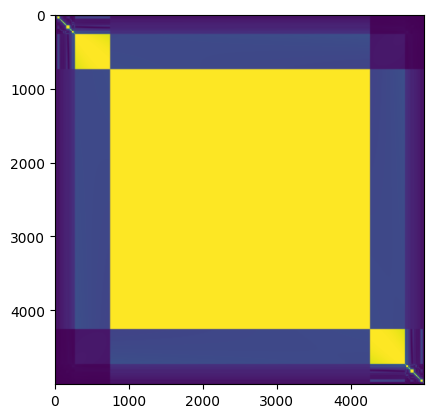

In [234]:
plt.imshow(P[-1])

C:\Users\kim9y\AppData\Local\Temp\ipykernel_8680\2861817684.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


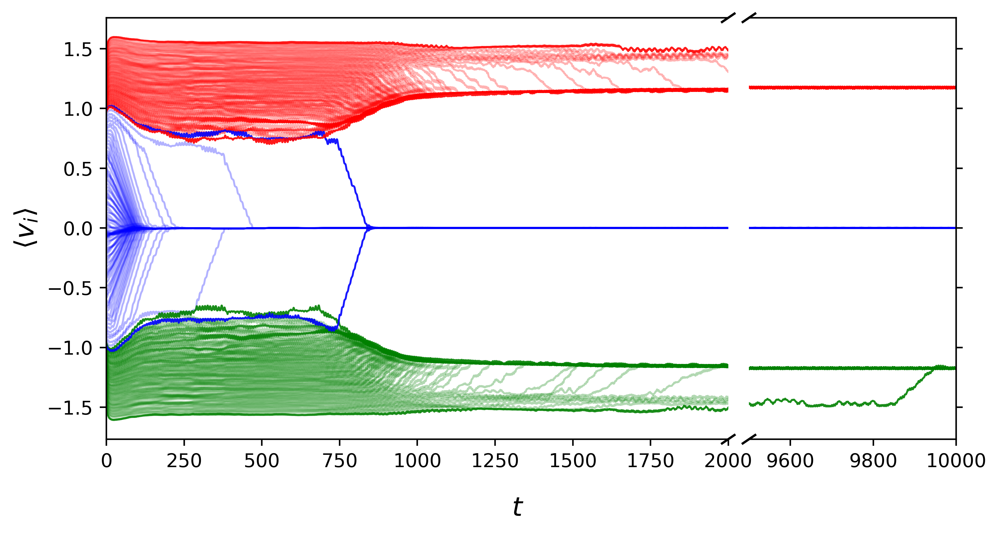

In [202]:
import matplotlib.pyplot as plt

# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 2000)         # 왼쪽 x 구간
RIGHT_XLIM  = (9500, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [3, 1]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.010            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=True, figsize=(8, 4),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)

# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)

# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
ax1.plot(t[:-s_lang], v_0_percentiles, color='b', lw=1, alpha=0.3)
ax1.plot(t[:-s_lang], v_p_percentiles, color='r', lw=1, alpha=0.3)
ax1.plot(t[:-s_lang], v_m_percentiles, color='g', lw=1, alpha=0.3)
ax1.plot(t[:-s_lang], max_v_0, color='b', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], max_v_p, color='r', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], max_v_m, color='g', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], min_v_0, color='b', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], min_v_p, color='r', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], min_v_m, color='g', lw=1, alpha=0.9)

# 오른쪽도 동일
ax2.plot(t[:-s_lang], v_0_percentiles, color='b', lw=1, alpha=0.3)
ax2.plot(t[:-s_lang], v_p_percentiles, color='r', lw=1, alpha=0.3)
ax2.plot(t[:-s_lang], v_m_percentiles, color='g', lw=1, alpha=0.3)
ax2.plot(t[:-s_lang], max_v_0, color='b', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], max_v_p, color='r', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], max_v_m, color='g', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], min_v_0, color='b', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], min_v_p, color='r', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], min_v_m, color='g', lw=1, alpha=0.9)
# --------------------------------------------------

# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d, 1+d), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d, 1+d), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*3, +d*3), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*3, +d*3), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향

# 라벨
ax1.set_ylabel(r"$\langle v_i \rangle$", fontsize=14)
fig.text(0.5, -0.03, r"$t$", ha="center", fontsize=14)

plt.tight_layout()
plt.show()


C:\Users\kim9y\AppData\Local\Temp\ipykernel_8680\4033659475.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


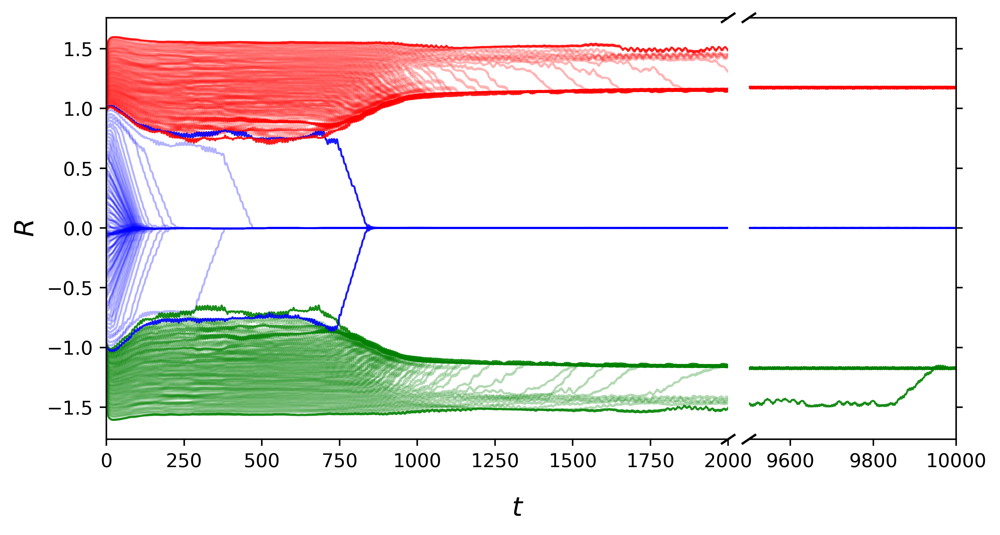

In [ ]:
import matplotlib.pyplot as plt

# === 원하는 구간/비율/간격/표식 크기 설정 ===
LEFT_XLIM   = (0, 2000)         # 왼쪽 x 구간
RIGHT_XLIM  = (9500, 10000)     # 오른쪽 x 구간
WIDTH_RATIOS = [3, 1]           # 두 축의 가로폭 비(왼쪽:오른쪽)
WSPACE       = 0.05             # 두 축 사이 간격(작을수록 붙음)
SLASH_SIZE   = 0.010            # // 크기 (축 상대좌표: 0~1)
SLASH_WIDTH  = 1.2              # // 선 굵기
SLASH_COLOR  = 'k'              # // 색
SLASH_ANGLE  = '//'             # 모양을 약간 바꾸고 싶으면 아래 수동 그리기 참고

fig, (ax1, ax2) = plt.subplots(
    1, 2, sharey=True, figsize=(8, 4),
    gridspec_kw={'width_ratios': WIDTH_RATIOS, 'wspace': WSPACE},
    dpi=500
)

# 왼쪽/오른쪽 x범위
ax1.set_xlim(*LEFT_XLIM)
ax2.set_xlim(*RIGHT_XLIM)

# (옵션) 중간 스파인/틱 정리 - 잘린 느낌 강화
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax1.yaxis.tick_left()
ax2.yaxis.tick_right()

# ---- 여기부터 데이터 그리기 (네가 쓰던 코드 유지) ----
# 예시: 원시/최대/최소 곡선(왼쪽)
ax1.plot(t[:-s_lang], v_0_percentiles, color='b', lw=1, alpha=0.3)
ax1.plot(t[:-s_lang], v_p_percentiles, color='r', lw=1, alpha=0.3)
ax1.plot(t[:-s_lang], v_m_percentiles, color='g', lw=1, alpha=0.3)
ax1.plot(t[:-s_lang], max_v_0, color='b', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], max_v_p, color='r', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], max_v_m, color='g', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], min_v_0, color='b', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], min_v_p, color='r', lw=1, alpha=0.9)
ax1.plot(t[:-s_lang], min_v_m, color='g', lw=1, alpha=0.9)

# 오른쪽도 동일
ax2.plot(t[:-s_lang], v_0_percentiles, color='b', lw=1, alpha=0.3)
ax2.plot(t[:-s_lang], v_p_percentiles, color='r', lw=1, alpha=0.3)
ax2.plot(t[:-s_lang], v_m_percentiles, color='g', lw=1, alpha=0.3)
ax2.plot(t[:-s_lang], max_v_0, color='b', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], max_v_p, color='r', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], max_v_m, color='g', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], min_v_0, color='b', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], min_v_p, color='r', lw=1, alpha=0.9)
ax2.plot(t[:-s_lang], min_v_m, color='g', lw=1, alpha=0.9)
# --------------------------------------------------

# 잘린 표시(//) 크기/두께/색 조절
d = SLASH_SIZE
kwargs = dict(clip_on=False, color=SLASH_COLOR, linewidth=SLASH_WIDTH)

# 왼쪽 축 끝(오른쪽 테두리)에 //
ax1.plot((1-d, 1+d), (-d, +d), transform=ax1.transAxes, **kwargs)   # 우하향
ax1.plot((1-d, 1+d), (1-d, 1+d), transform=ax1.transAxes, **kwargs) # 우상향

# 오른쪽 축 시작(왼쪽 테두리)에 //
ax2.plot((-d*3, +d*3), (-d, +d), transform=ax2.transAxes, **kwargs)     # 좌하향
ax2.plot((-d*3, +d*3), (1-d, 1+d), transform=ax2.transAxes, **kwargs)   # 좌상향

# 라벨
ax1.set_ylabel(r"$\langle v_i \rangle$", fontsize=14)
fig.text(0.5, -0.03, r"$t$", ha="center", fontsize=14)

plt.tight_layout()
plt.show()


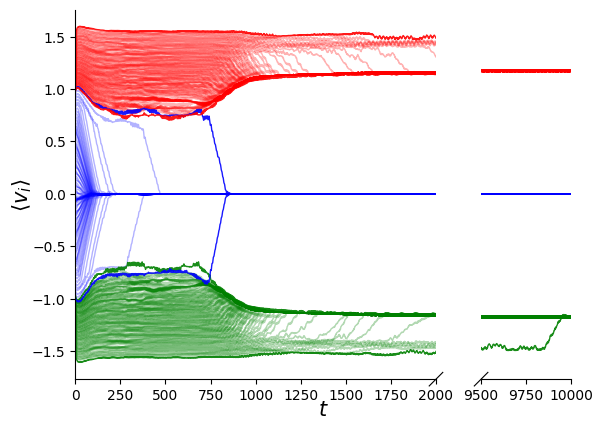

In [197]:
from brokenaxes import brokenaxes

# bax = brokenaxes(xlims=((0,2000),(9500,10000)),  hspace=0.01)
bax = brokenaxes(xlims=((0,2000),(9500,10000)), hspace=0.01)
bax.set_xlabel(r"$t$",fontsize=15)
bax.set_ylabel(r"$\langle v_i \rangle$",fontsize=15)

# 왼쪽 축: 0~2000
bax.plot(t[:-s_lang],v_0_percentiles,color='b',lw=1,alpha=0.3);
bax.plot(t[:-s_lang],v_p_percentiles,color='r',lw=1,alpha=0.3);
bax.plot(t[:-s_lang],v_m_percentiles,color='g',lw=1,alpha=0.3);
bax.plot(t[:-s_lang],max_v_0,color='b',lw=1,alpha=0.9);
bax.plot(t[:-s_lang],max_v_p,color='r',lw=1,alpha=0.9);
bax.plot(t[:-s_lang],max_v_m,color='g',lw=1,alpha=0.9);
bax.plot(t[:-s_lang],min_v_0,color='b',lw=1,alpha=0.9);
bax.plot(t[:-s_lang],min_v_p,color='r',lw=1,alpha=0.9);
bax.plot(t[:-s_lang],min_v_m,color='g',lw=1,alpha=0.9);


(0.0, 2000.0)

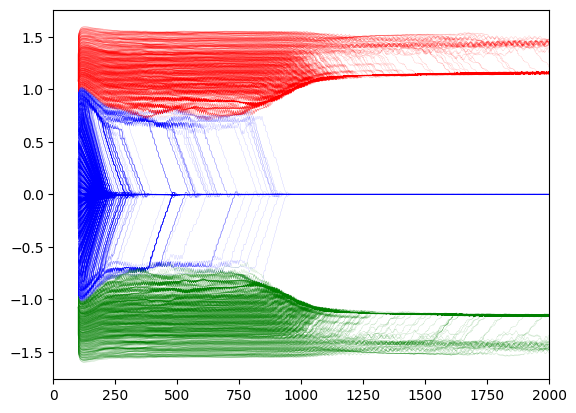

In [112]:
plt.fill_between(t[s_lang:],q25_v_0,q75_v_0,color='b',alpha=0.3)
plt.fill_between(t[s_lang:],q25_v_p,q75_v_p,color='r',alpha=0.3)
plt.fill_between(t[s_lang:],q25_v_m,q75_v_m,color='g',alpha=0.3)


plt.plot(t[s_lang::1],avg_dtheta[::1,c_0],c='b',alpha=0.3,lw=0.2);
plt.plot(t[s_lang::1],avg_dtheta[::1,c_p0],c='r',alpha=0.3,lw=0.2);
plt.plot(t[s_lang::1],avg_dtheta[::1,c_m0],c='g',alpha=0.3,lw=0.2);


plt.xlim(0,2000)

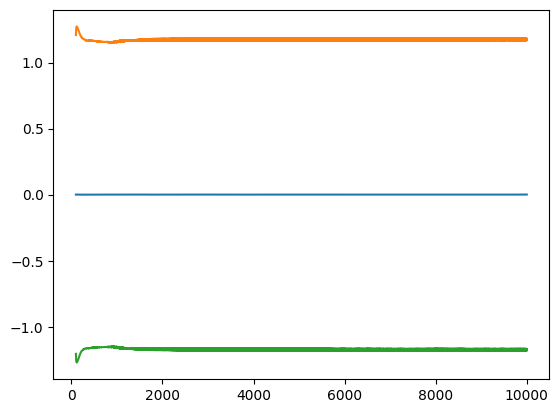

In [65]:
plt.plot(t[s_lang:],m_v_0)
plt.plot(t[s_lang:],m_v_p)
plt.plot(t[s_lang:],m_v_m)

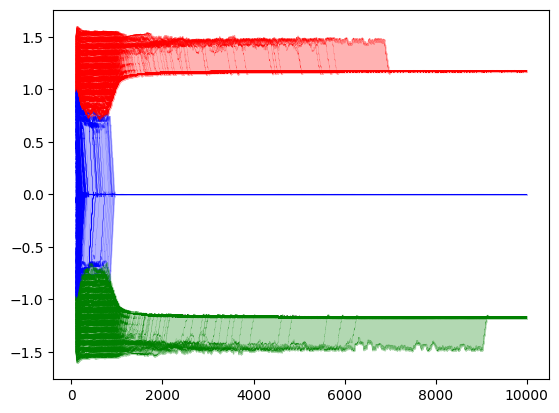

In [100]:
plt.plot(t[s_lang::10],avg_dtheta[::10,c_0],c='b',alpha=0.8,lw=0.1);
plt.plot(t[s_lang::10],avg_dtheta[::10,c_p0],c='r',alpha=0.8,lw=0.1);
plt.plot(t[s_lang::10],avg_dtheta[::10,c_m0],c='g',alpha=0.8,lw=0.1);


plt.fill_between(t[s_lang:],min_v_0,max_v_0,color='b',alpha=0.3)
plt.fill_between(t[s_lang:],min_v_p,max_v_p,color='r',alpha=0.3)
plt.fill_between(t[s_lang:],min_v_m,max_v_m,color='g',alpha=0.3)


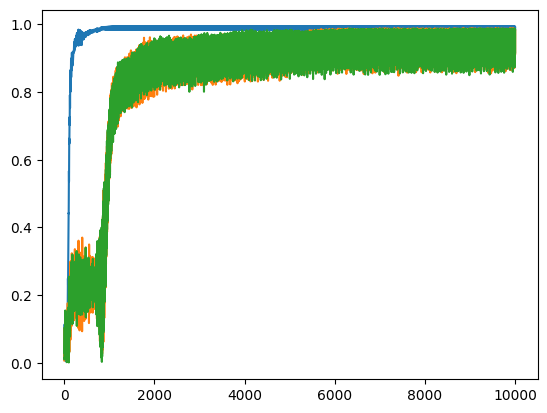

In [51]:
plt.plot(t,rho_0)
plt.plot(t,rho_p)
plt.plot(t,rho_m)

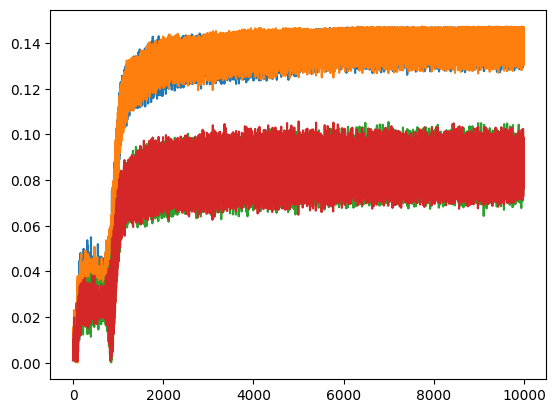

In [48]:
# plt.plot(t,r0)
plt.plot(t,rp_0)
plt.plot(t,rm_0)
plt.plot(t,r_p)
plt.plot(t,r_m)

(-0.2, 0.2)

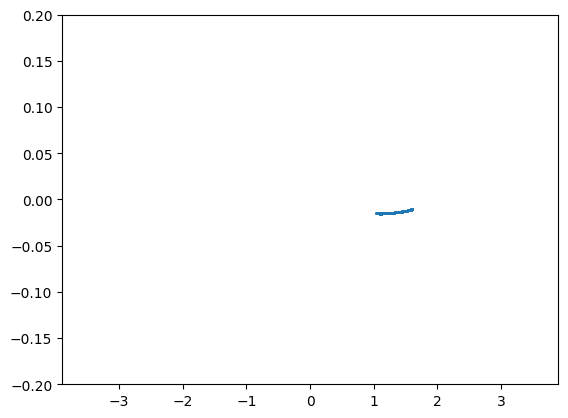

In [39]:
plt.scatter(omega,avg_dtheta[idx]-(OPS[idx]+dps[idx]),s=1)
plt.ylim(-0.2,0.2)
plt.ylim()

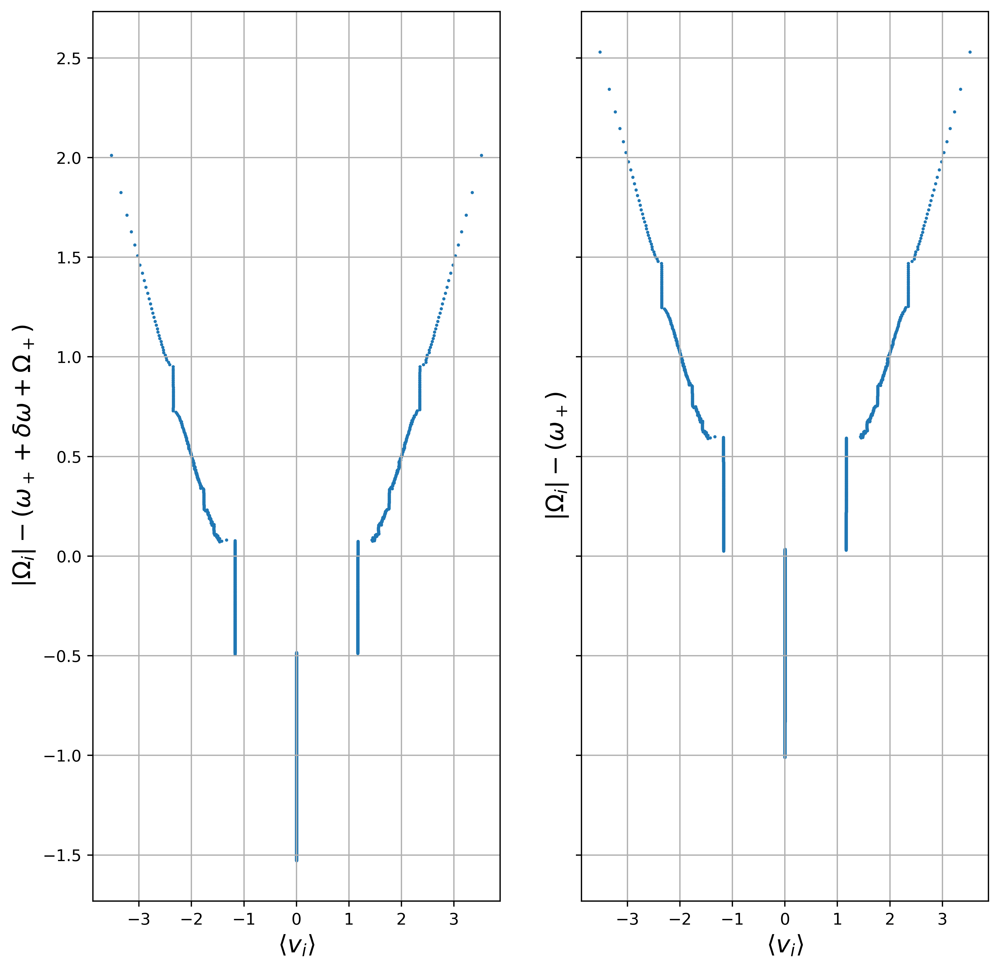

In [30]:
idx = -1
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,10),dpi=500,sharey=True)
ax1.scatter(avg_dtheta[idx],np.abs(omega)-(OPS[idx]+dps[idx]+opp[idx]),s=1)
ax2.scatter(avg_dtheta[idx],np.abs(omega)-(OPS[idx]),s=1)



# plt.gca().set_aspect('equal')
# plt.ylim(-0.4,0.4)

ax1.set_xlabel(r'$\langle v_i \rangle$',fontsize=15)
ax2.set_xlabel(r'$\langle v_i \rangle$',fontsize=15)
ax1.set_ylabel(r'$|\Omega_i|-(\omega_++\delta\omega+\Omega_+)$',fontsize=15)
ax2.set_ylabel(r'$|\Omega_i|-(\omega_+)$',fontsize=15)
ax1.grid()
ax2.grid()

In [556]:
opp.shape

(50000,)

In [548]:
plt.plot(OPS+dps+opp)

ValueError: operands could not be broadcast together with shapes (49000,) (50000,) 

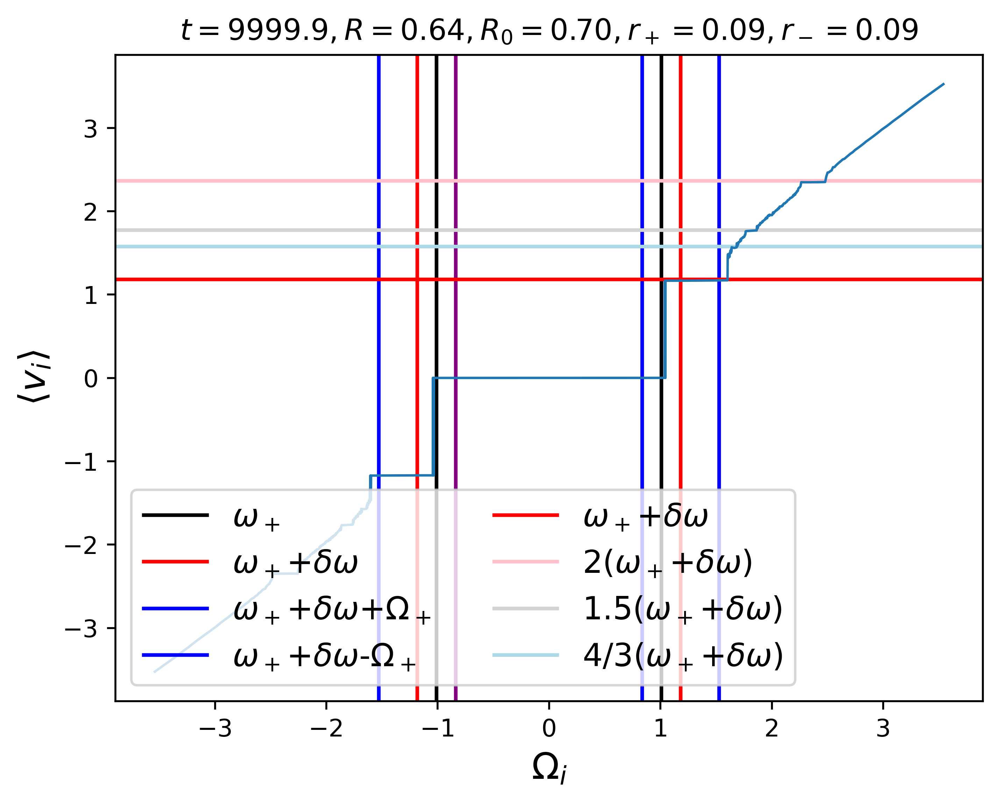

In [31]:
idx = -1
plt.figure(dpi = 500)
plt.title(rf'$t={t[idx]:.01f},R={r_s[idx]:.02f},R_0={r0_s[idx]:.02f},r_+={rp_s[idx]:.02f},r_-={rm_s[idx]:.02f}$')
plt.axvline(OPS[idx],color='k',label=r'$\omega_+$')
plt.axvline(-OPS[idx],color='k')
plt.axvline(OPS[idx]+dps[idx],color='r',label=r'$\omega_+$+$\delta\omega$')
plt.axvline(-(OPS[idx]+dps[idx]),color='r')

plt.axvline(OPS[idx]+dps[idx]+opp[idx],color='b',label=r'$\omega_+$+$\delta\omega$+$\Omega_+$')
plt.axvline(OPS[idx]+dps[idx]-opp[idx],color='b',label=r'$\omega_+$+$\delta\omega$-$\Omega_+$')

plt.axvline(-(OPS[idx]+dps[idx]+opp[idx]),color='b')
plt.axvline(-(OPS[idx]+dps[idx]-opp[idx]),color='purple')
plt.axhline(OPS[idx]+dps[idx],color='r',label=r'$\omega_+$+$\delta\omega$')
plt.axhline(2*(OPS[idx]+dps[idx]),color='pink',label=r'2$(\omega_+$+$\delta\omega)$')

plt.axhline(1.5*(OPS[idx]+dps[idx]),color='lightgrey',label=r'1.5$(\omega_+$+$\delta\omega)$')
plt.axhline(4/3*(OPS[idx]+dps[idx]),color='lightblue',label=r'4/3$(\omega_+$+$\delta\omega)$')
plt.xlabel(r'$\Omega_i$',fontsize=15)
plt.ylabel(r'$\langle v_i \rangle$',fontsize=15)
# plt.grid()
plt.legend(fontsize=13,ncol=2,loc='lower left')
plt.plot(omega,avg_dtheta[idx],lw=1)

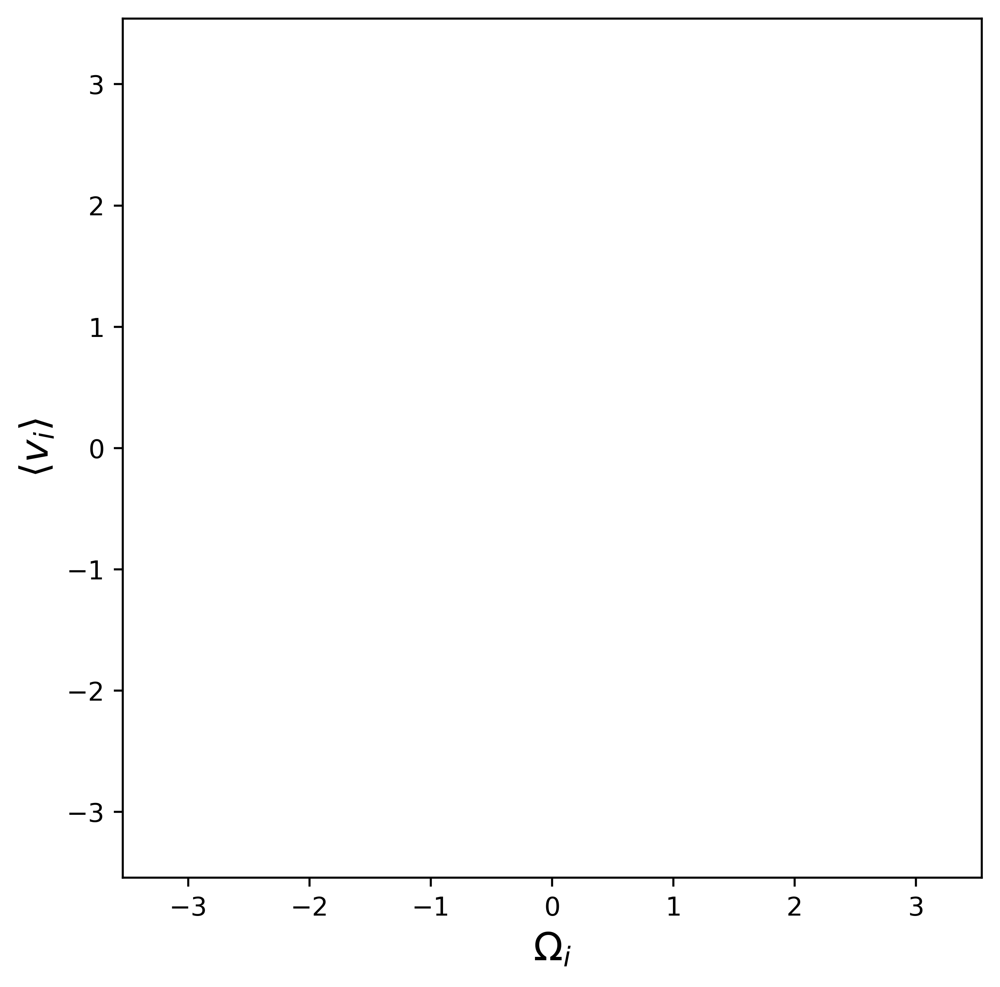

In [576]:
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(8,6),dpi=500)
ax.set_xlim(omega.min(), omega.max())
ax.set_ylim(np.min(avg_dtheta), np.max(avg_dtheta))
ax.set_xlabel(r'$\Omega_i$',fontsize=15)
ax.set_ylabel(r'$\langle v_i \rangle$',fontsize=15)
ax.set_aspect('equal')
vlines = []
line, = ax.plot([], [], lw=1,zorder=10)
title = ax.text(0.5, 1.05, '', transform=ax.transAxes, ha='center', fontsize=13)

def init():
    line.set_data([], [])
    for v in vlines:
        v.remove()
    vlines.clear()
    title.set_text('')
    return [line, title] + vlines

def animate(idx):
    for v in vlines:
        v.remove()
    vlines.clear()
    vlines.append(ax.axvline(OPS[idx],color='k'))
    vlines.append(ax.axvline(-OPS[idx],color='k'))
    vlines.append(ax.axvline(OPS[idx]+dps[idx],color='r'))
    vlines.append(ax.axhline(OPS[idx]+dps[idx],color='r'))
    vlines.append(ax.axhline(2*(OPS[idx]+dps[idx]),color='pink'))
    vlines.append(ax.axhline(4/3*(OPS[idx]+dps[idx]),color='lightblue'))
    vlines.append(ax.axhline(-4/3*(OPS[idx]+dps[idx]),color='lightblue'))
    vlines.append(ax.axhline(1.5*(OPS[idx]+dps[idx]),color='lightgrey'))
    vlines.append(ax.axhline(-1.5*(OPS[idx]+dps[idx]),color='lightgrey'))
    vlines.append(ax.axvline(-(OPS[idx]+dps[idx]),color='r'))
    vlines.append(ax.axhline(-(OPS[idx]+dps[idx]),color='r'))
    vlines.append(ax.axhline(-2*(OPS[idx]+dps[idx]),color='pink'))
    vlines.append(ax.axvline(OPS[idx]+dps[idx]+opp[idx],color='b'))
    vlines.append(ax.axvline(-(OPS[idx]+dps[idx]+opp[idx]),color='b'))
    vlines.append(ax.axvline(OPS[idx]+dps[idx]-opp[idx],color='b'))
    vlines.append(ax.axvline(-(OPS[idx]+dps[idx]-opp[idx]),color='b'))
    title.set_text(rf'$t={t[idx]},R={r_s[idx]:.02f},R_0={r0_s[idx]:.02f},r_+={rp_s[idx]:.02f},r_-={rm_s[idx]:.02f}$')
    line.set_data(omega, avg_dtheta[idx])
    return [line, title] + vlines

ani = animation.FuncAnimation(fig, animate, frames=range(0, len(t)-s_lang, 100), init_func=init, blit=False, interval=100)

In [577]:
from IPython.display import HTML
HTML(ani.to_html5_video())

In [526]:
opp = 4/np.pi * np.sqrt(K*rp_/m) - 0.3056/np.sqrt(K*rp_*m**3)


In [527]:
import sympy as sp
K_,m_,x,s = sp.symbols('K m x s',real=True,positive=True)
f = 4/sp.pi * sp.sqrt(K_/m_)*sp.sqrt(x) - s/sp.sqrt(K_*m_**3)/sp.sqrt(x)
(f**2*m_**2).expand().simplify()

16*K*m*x/pi**2 - 8*s/pi + s**2/(K*m*x)

In [140]:
S = 0.3056